In [ ]:
import os
import numpy as np
import pandas as pd
import pickle

import matplotlib.pyplot as plt
import cv2

In [ ]:
data_dir = '/home/simon/Documents/Bodies/data/done_dfs/'

with open(f'{data_dir}bodies_df_2022_v1_4_JACOB.pkl', 'rb') as file:
    bodies_df = pickle.load(file)

In [11]:
sub_df = bodies_df.loc[(bodies_df['city'] == 'Kirkuk') & (bodies_df['damaged_property_mean'] >= 1), : ] 

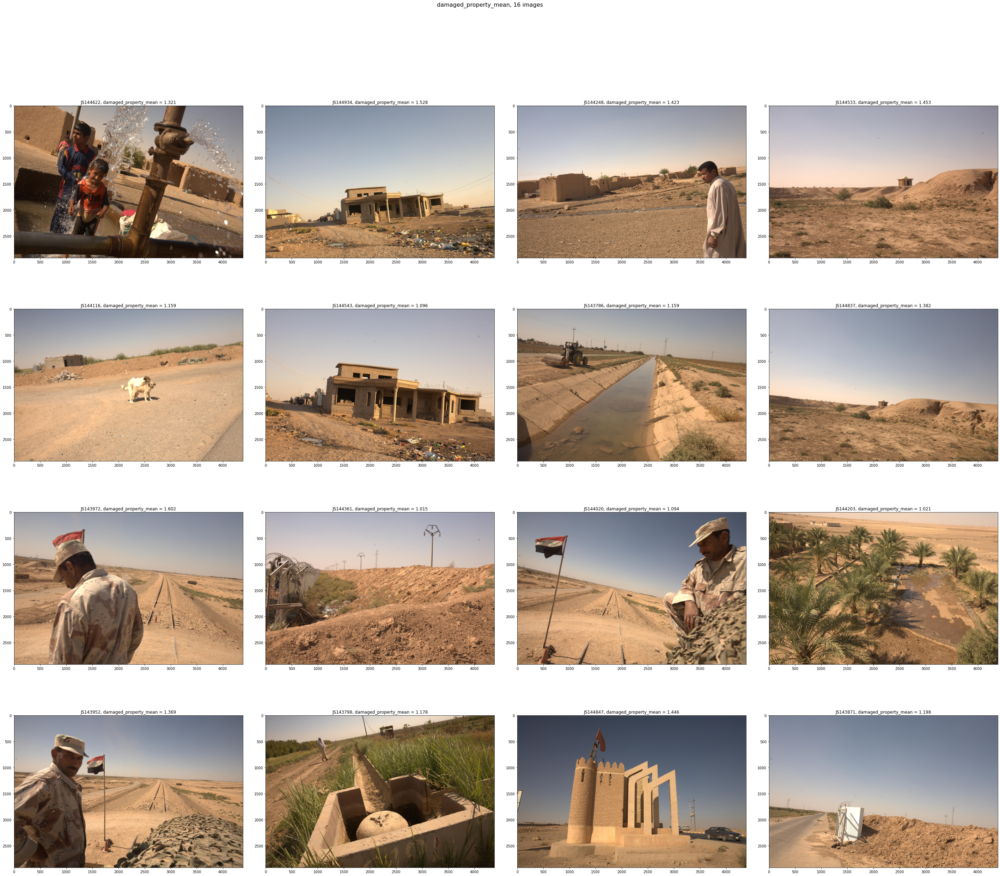

In [12]:
imgs_dir = '/media/simon/Seagate Expansion Drive/images_spanner'
#eks_dir = '/home/simon/Documents/Bodies/figures/ra_eks'


n = 16
sub_df.sample(n)
measure = 'damaged_property_mean'

sample_img = sub_df.sample(n)['img_id']
scores = sub_df.sample(n)[measure]


plt.figure(figsize = [50,40])
for i, j in enumerate(sample_img):

    path_image = os.path.join(imgs_dir, j + '.jpg')
    
    # print(path_image)

    plt.subplot(int(np.sqrt(n)), int(np.sqrt(n)), i+1)
    plt.subplots_adjust(hspace = 0.3, wspace = 0.1)
        
    img = cv2.imread(path_image)

    # print(img)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # correcting the colors:
    
    plt.imshow(img)
    plt.title(f'{j}, {measure} = {scores.iloc[i]:.3f}')

suptitle = f'{measure}, {n} images'
plt.suptitle(suptitle, size=16)

# fig_path = f'{eks_dir}/{model}_{measure}_{sample}.pdf'
# plt.savefig(fig_path, bbox_inches="tight")

plt.show()

In [15]:
sub_df = bodies_df.loc[(bodies_df['city'] == 'Abu Ghraib') & (bodies_df['damaged_property_mean'] >= 1), : ] 

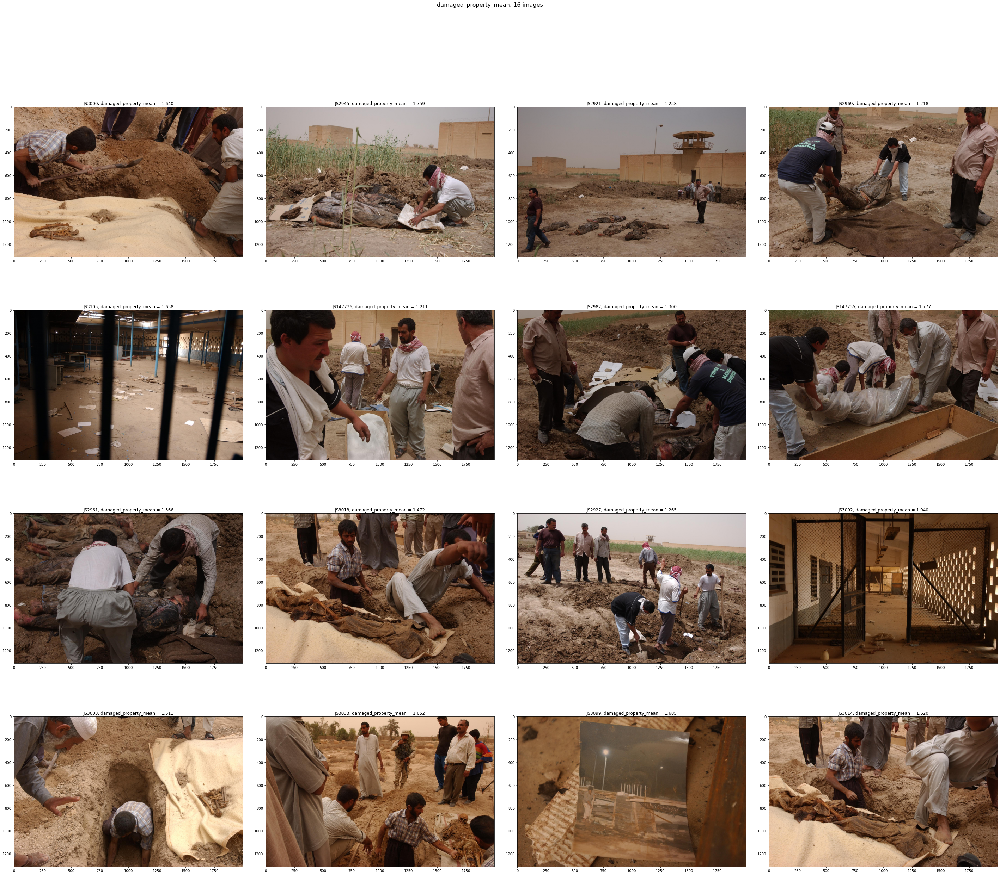

In [16]:
imgs_dir = '/media/simon/Seagate Expansion Drive/images_spanner'
#eks_dir = '/home/simon/Documents/Bodies/figures/ra_eks'


n = 16
sub_df.sample(n)
measure = 'damaged_property_mean'

sample_img = sub_df.sample(n)['img_id']
scores = sub_df.sample(n)[measure]


plt.figure(figsize = [50,40])
for i, j in enumerate(sample_img):

    path_image = os.path.join(imgs_dir, j + '.jpg')
    
    # print(path_image)

    plt.subplot(int(np.sqrt(n)), int(np.sqrt(n)), i+1)
    plt.subplots_adjust(hspace = 0.3, wspace = 0.1)
        
    img = cv2.imread(path_image)

    # print(img)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # correcting the colors:
    
    plt.imshow(img)
    plt.title(f'{j}, {measure} = {scores.iloc[i]:.3f}')

suptitle = f'{measure}, {n} images'
plt.suptitle(suptitle, size=16)

# fig_path = f'{eks_dir}/{model}_{measure}_{sample}.pdf'
# plt.savefig(fig_path, bbox_inches="tight")

plt.show()

In [ ]:
def loop_plot(bodies_df, sample = 'top'):

    ra = ['emotions_t2_mean', 'all_formal_mean', 'all_privat_mean', 'all_urban_mean', 'all_militarized_mean', 
          'damaged_property_mean', 'all_public_mean', 'emotions_t1_mean', 'mass_protest_mean', 'all_rural_mean']

    for measure in ra:

        percetile95 = np.percentile(bodies_df[measure], 95)
        percetile5 = np.percentile(bodies_df[measure], 5)
        n = 16

        if sample == 'top':

            sample_img = bodies_df[bodies_df[measure] >= percetile95].sample(n)['img_id']
            scores = bodies_df[bodies_df[measure] >= percetile95].sample(n)[measure]

        elif sample == 'bottom':

            sample_img = bodies_df[bodies_df[measure] <= percetile5].sample(n)['img_id']
            scores = bodies_df[bodies_df[measure] <= percetile5].sample(n)[measure]


        else:
            print('wrong input')


        imgs_dir = '/media/simon/Seagate Expansion Drive/images_spanner'
        eks_dir = '/home/simon/Documents/Bodies/figures/ra_eks'

        plt.figure(figsize = [50,40])
        for i, j in enumerate(sample_img):

            path_image = os.path.join(imgs_dir, j + '.jpg')
            
            # print(path_image)

            plt.subplot(int(np.sqrt(n)), int(np.sqrt(n)), i+1)
            plt.subplots_adjust(hspace = 0.3, wspace = 0.1)
                
            img = cv2.imread(path_image)

            # print(img)

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # correcting the colors:
            
            plt.imshow(img)
            plt.title(f'{j}, {measure} = {scores.iloc[i]:.3f}')

        suptitle = f'{measure}, {sample} {n} images'
        plt.suptitle(suptitle, size=16)

        # fig_path = f'{eks_dir}/{model}_{measure}_{sample}.pdf'
        # plt.savefig(fig_path, bbox_inches="tight")

        plt.show()